# Question
1.单日中随着时间的变化，天气是怎么变化的

2.不同站在同一时间天气是否一样

3.平均气压是否与天气有关

4.平均温度是否与天气有关

5.同一个站每天同一时间段是否天气会相同

In [2]:
import numpy as np

# Subway ridership for 5 stations on 10 different days
ridership = np.array([
    [0, 0, 2, 5, 0],
    [1478, 3877, 3674, 2328, 2539],
    [1613, 4088, 3991, 6461, 2691],
    [1560, 3392, 3826, 4787, 2613],
    [1608, 4802, 3932, 4477, 2705],
    [1576, 3933, 3909, 4979, 2685],
    [95, 229, 255, 496, 201],
    [2, 0, 1, 27, 0],
    [1438, 3785, 3589, 4174, 2215],
    [1342, 4043, 4009, 4665, 3033]
])

def mean_riders_for_max_station(ridership):
    '''
    Fill in this function to find the station with the maximum riders on the
    first day, then return the mean riders per day for that station. Also
    return the mean ridership overall for comparsion.

    Hint: NumPy's argmax() function might be useful:
    http://docs.scipy.org/doc/numpy/reference/generated/numpy.argmax.html
    '''
    max_index = ridership[0, :].argmax()
    overall_mean = ridership.mean()
    mean_for_max = ridership[:,max_index].mean()

    return (overall_mean, mean_for_max)

In [3]:
def min_and_max_riders_per_day(ridership):
    '''
    Fill in this function. First, for each subway station, calculate the
    mean ridership per day. Then, out of all the subway stations, return the
    maximum and minimum of these values. That is, find the maximum
    mean-ridership-per-day and the minimum mean-ridership-per-day for any
    subway station.
    '''
    mean_per_day = ridership.mean(axis=0)
    max_daily_ridership = mean_per_day.max()  
    min_daily_ridership = mean_per_day.min() 
    
    return (max_daily_ridership, min_daily_ridership)

In [4]:
import pandas as pd

ridership_df = pd.DataFrame(
    data=[[   0,    0,    2,    5,    0],
          [1478, 3877, 3674, 2328, 2539],
          [1613, 4088, 3991, 6461, 2691],
          [1560, 3392, 3826, 4787, 2613],
          [1608, 4802, 3932, 4477, 2705],
          [1576, 3933, 3909, 4979, 2685],
          [  95,  229,  255,  496,  201],
          [   2,    0,    1,   27,    0],
          [1438, 3785, 3589, 4174, 2215],
          [1342, 4043, 4009, 4665, 3033]],
    index=['05-01-11', '05-02-11', '05-03-11', '05-04-11', '05-05-11',
           '05-06-11', '05-07-11', '05-08-11', '05-09-11', '05-10-11'],
    columns=['R003', 'R004', 'R005', 'R006', 'R007']
)

def mean_riders_for_max_station(ridership):
    '''
    Fill in this function to find the station with the maximum riders on the
    first day, then return the mean riders per day for that station. Also
    return the mean ridership overall for comparsion.

    This is the same as a previous exercise, but this time the
    input is a Pandas DataFrame rather than a 2D NumPy array.
    '''

    max_index = ridership.iloc[0].argmax()
    overall_mean = ridership.values.mean()
    mean_for_max = ridership[max_index].mean()

    return (overall_mean, mean_for_max)

In [5]:
import pandas as pd

filename = '/home/loveshadev/PycharmProjects/Udacity/TestProject/DataAnalysis/nyc-subway-weather.csv'
subway_df = pd.read_csv(filename)


def correlation(x, y):
    '''
    Fill in this function to compute the correlation between the two
    input variables. Each input is either a NumPy array or a Pandas
    Series.

    correlation = average of (x in standard units) times (y in standard units)

    Remember to pass the argument "ddof=0" to the Pandas std() function!
    '''
    std_x = (x - x.mean()) / x.std(ddof=0)
    std_y = (y - y.mean()) / y.std(ddof=0)
    return (std_x * std_y).mean()


entries = subway_df['ENTRIESn_hourly']
cum_entries = subway_df['ENTRIESn']
rain = subway_df['meanprecipi']
temp = subway_df['meantempi']


print correlation(entries, rain)
print correlation(entries, temp)
print correlation(rain, temp)

print correlation(entries, cum_entries)

0.0356485157722
-0.0266933483216
-0.229034323408
0.585895470766


In [6]:
def get_hourly_entries_and_exits(entries_and_exits):
    '''
    Fill in this function to take a DataFrame with cumulative entries
    and exits (entries in the first column, exits in the second) and
    return a DataFrame with hourly entries and exits (entries in the
    first column, exits in the second).
    '''
    return entries_and_exits-entries_and_exits.shift(1)

In [7]:
# Change False to True for this block of code to see what it does

# DataFrame applymap()
if False:
    df = pd.DataFrame({
        'a': [1, 2, 3],
        'b': [10, 20, 30],
        'c': [5, 10, 15]
    })


    def add_one(x):
        return x + 1


    print df.applymap(add_one)

grades_df = pd.DataFrame(
    data={'exam1': [43, 81, 78, 75, 89, 70, 91, 65, 98, 87],
          'exam2': [24, 63, 56, 56, 67, 51, 79, 46, 72, 60]},
    index=['Andre', 'Barry', 'Chris', 'Dan', 'Emilio',
           'Fred', 'Greta', 'Humbert', 'Ivan', 'James']
)

def change_score_to_grade(score):
    if score >= 90 and score <= 100:
        return 'A'
    elif score >= 80 and score < 90:
        return 'B'
    elif score >= 70 and score < 80:
        return 'C'
    elif score >= 60 and score < 70:
        return 'D'
    else:
        return 'F'


def convert_grades(grades):
    '''
    Fill in this function to convert the given DataFrame of numerical
    grades to letter grades. Return a new DataFrame with the converted
    grade.

    The conversion rule is:
        90-100 -> A
        80-89  -> B
        70-79  -> C
        60-69  -> D
        0-59   -> F
    '''
    return grades.applymap(change_score_to_grade)

print convert_grades(grades_df)

        exam1 exam2
Andre       F     F
Barry       B     D
Chris       C     F
Dan         C     F
Emilio      B     D
Fred        C     F
Greta       A     C
Humbert     D     F
Ivan        A     C
James       B     D


In [8]:
import pandas as pd

grades_df = pd.DataFrame(
    data={'exam1': [43, 81, 78, 75, 89, 70, 91, 65, 98, 87],
          'exam2': [24, 63, 56, 56, 67, 51, 79, 46, 72, 60]},
    index=['Andre', 'Barry', 'Chris', 'Dan', 'Emilio',
           'Fred', 'Greta', 'Humbert', 'Ivan', 'James']
)

# Change False to True for this block of code to see what it does

# DataFrame apply()
if False:
    def convert_grades_curve(exam_grades):
        # Pandas has a bult-in function that will perform this calculation
        # This will give the bottom 0% to 10% of students the grade 'F',
        # 10% to 20% the grade 'D', and so on. You can read more about
        # the qcut() function here:
        # http://pandas.pydata.org/pandas-docs/stable/generated/pandas.qcut.html
        return pd.qcut(exam_grades,
                       [0, 0.1, 0.2, 0.5, 0.8, 1],
                       labels=['F', 'D', 'C', 'B', 'A'])


    # qcut() operates on a list, array, or Series. This is the
    # result of running the function on a single column of the
    # DataFrame.
    print convert_grades_curve(grades_df['exam1'])

    # qcut() does not work on DataFrames, but we can use apply()
    # to call the function on each column separately
    print grades_df.apply(convert_grades_curve)

def standardize_col_scores(exam_grades):
    e_mean = exam_grades.mean()
    e_std = exam_grades.std()
    return (exam_grades - e_mean) / e_std


def standardize(df):
    '''
    Fill in this function to standardize each column of the given
    DataFrame. To standardize a variable, convert each value to the
    number of standard deviations it is above or below the mean.
    '''
    return df.apply(standardize_col_scores)

print standardize(grades_df)

            exam1     exam2
Andre   -2.196525 -2.186335
Barry    0.208891  0.366571
Chris    0.018990 -0.091643
Dan     -0.170911 -0.091643
Emilio   0.715295  0.628408
Fred    -0.487413 -0.418938
Greta    0.841896  1.413917
Humbert -0.803916 -0.746234
Ivan     1.284999  0.955703
James    0.588694  0.170194


In [9]:
df = pd.DataFrame({
    'a': [4, 5, 3, 1, 2],
    'b': [20, 10, 40, 50, 30],
    'c': [25, 20, 5, 15, 10]
})

# Change False to True for this block of code to see what it does
    
def get_second_largest_by_col(col):
    col_values = col.sort_values(ascending=False)
    return col_values.iloc[1]

def second_largest(df):
    '''
    Fill in this function to return the second-largest value of each 
    column of the input DataFrame.
    '''
    return df.apply(get_second_largest_by_col)

print second_largest(df)

a     4
b    40
c    20
dtype: int64


In [10]:
import pandas as pd

# Change False to True for each block of code to see what it does

# Adding a Series to a square DataFrame
if False:
    s = pd.Series([1, 2, 3, 4])
    df = pd.DataFrame({
        0: [10, 20, 30, 40],
        1: [50, 60, 70, 80],
        2: [90, 100, 110, 120],
        3: [130, 140, 150, 160]
    })

    print df
    print ''  # Create a blank line between outputs
    print df + s

# Adding a Series to a one-row DataFrame
if False:
    s = pd.Series([1, 2, 3, 4])
    df = pd.DataFrame({0: [10], 1: [20], 2: [30], 3: [40]})

    print df
    print ''  # Create a blank line between outputs
    print df + s

# Adding a Series to a one-column DataFrame
if False:
    s = pd.Series([1, 2, 3, 4])
    df = pd.DataFrame({0: [10, 20, 30, 40]})

    print df
    print ''  # Create a blank line between outputs
    print df + s

# Adding when DataFrame column names match Series index
if False:
    s = pd.Series([1, 2, 3, 4], index=['a', 'b', 'c', 'd'])
    df = pd.DataFrame({
        'a': [10, 20, 30, 40],
        'b': [50, 60, 70, 80],
        'c': [90, 100, 110, 120],
        'd': [130, 140, 150, 160]
    })

    print df
    print ''  # Create a blank line between outputs
    print df + s

# Adding when DataFrame column names don't match Series index
if True:
    s = pd.Series([1, 2, 3, 4])
    df = pd.DataFrame({
        'a': [10, 20, 30, 40],
        'b': [50, 60, 70, 80],
        'c': [90, 100, 110, 120],
        'd': [130, 140, 150, 160]
    })

    print df
    print ''  # Create a blank line between outputs
    print df + s

    a   b    c    d
0  10  50   90  130
1  20  60  100  140
2  30  70  110  150
3  40  80  120  160

    0   1   2   3   a   b   c   d
0 NaN NaN NaN NaN NaN NaN NaN NaN
1 NaN NaN NaN NaN NaN NaN NaN NaN
2 NaN NaN NaN NaN NaN NaN NaN NaN
3 NaN NaN NaN NaN NaN NaN NaN NaN


In [11]:
def standardize(df):
    '''
    Fill in this function to standardize each column of the given
    DataFrame. To standardize a variable, convert each value to the
    number of standard deviations it is above or below the mean.

    This time, try to use vectorized operations instead of apply().
    You should get the same results as you did before.
    '''
    mean = df.mean()
    std = df.std(ddof=0)
    return (df - mean)/std

station
1 AVE              63.423784
103 ST-CORONA      62.599451
104 ST             62.256471
110 ST             63.375978
110 ST-CPN         63.600581
111 ST             62.376991
121 ST             62.081714
125 ST             63.328652
135 ST             63.423784
138 ST-GR CONC     62.721084
14 ST              63.394086
145 ST             63.592471
148 ST-LENOX       63.561143
149 ST-3 AVE       62.563043
149 ST-GR CONC     62.661538
167 ST             63.121652
168 ST-BROADWAY    63.419022
169 ST             62.103763
170 ST             62.769942
174-175 ST         62.811628
175 ST             63.394086
176 ST             62.383333
18 AVE             63.543516
18 ST              63.394086
181 ST             62.350000
182-183 ST         62.750888
183 ST             62.662147
190 ST             63.217901
191 ST             63.377326
2 AVE              63.394086
                     ...    
PRESIDENT ST       63.374375
PRINCE ST-B'WAY    63.394086
PROSPECT AVE       63.545833
PROSPE

/home/loveshadev/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


station
1 AVE              Axes(0.125,0.125;0.775x0.755)
103 ST-CORONA      Axes(0.125,0.125;0.775x0.755)
104 ST             Axes(0.125,0.125;0.775x0.755)
110 ST             Axes(0.125,0.125;0.775x0.755)
110 ST-CPN         Axes(0.125,0.125;0.775x0.755)
111 ST             Axes(0.125,0.125;0.775x0.755)
121 ST             Axes(0.125,0.125;0.775x0.755)
125 ST             Axes(0.125,0.125;0.775x0.755)
135 ST             Axes(0.125,0.125;0.775x0.755)
138 ST-GR CONC     Axes(0.125,0.125;0.775x0.755)
14 ST              Axes(0.125,0.125;0.775x0.755)
145 ST             Axes(0.125,0.125;0.775x0.755)
148 ST-LENOX       Axes(0.125,0.125;0.775x0.755)
149 ST-3 AVE       Axes(0.125,0.125;0.775x0.755)
149 ST-GR CONC     Axes(0.125,0.125;0.775x0.755)
167 ST             Axes(0.125,0.125;0.775x0.755)
168 ST-BROADWAY    Axes(0.125,0.125;0.775x0.755)
169 ST             Axes(0.125,0.125;0.775x0.755)
170 ST             Axes(0.125,0.125;0.775x0.755)
174-175 ST         Axes(0.125,0.125;0.775x0.755)
175 ST      

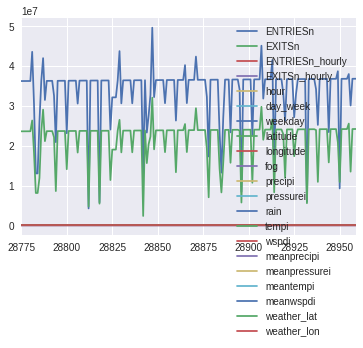

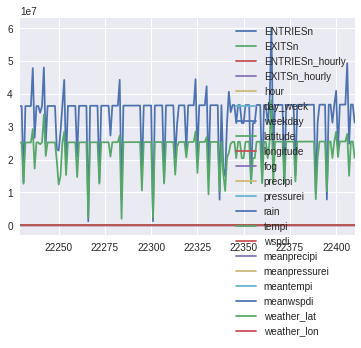

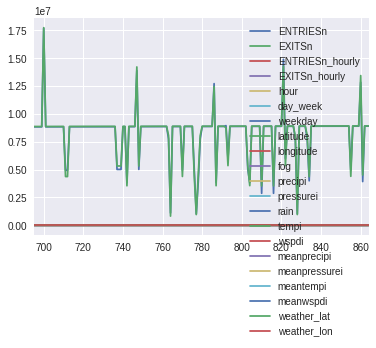

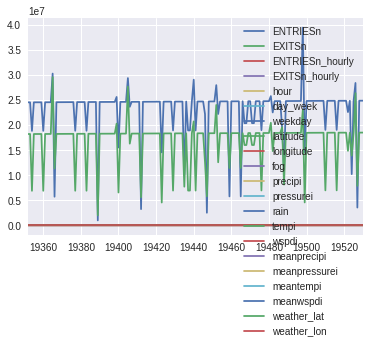

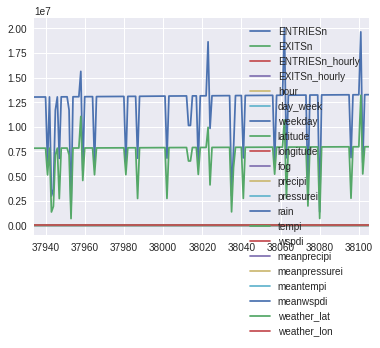

...

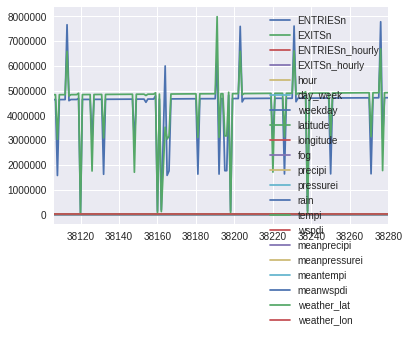

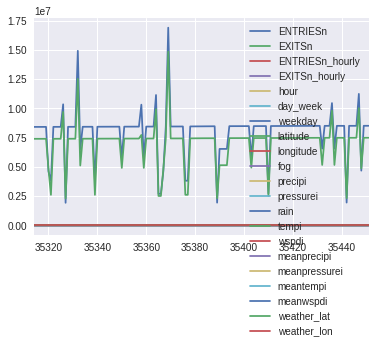

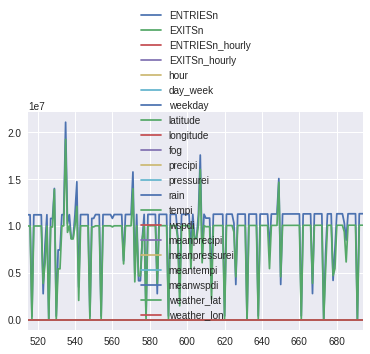

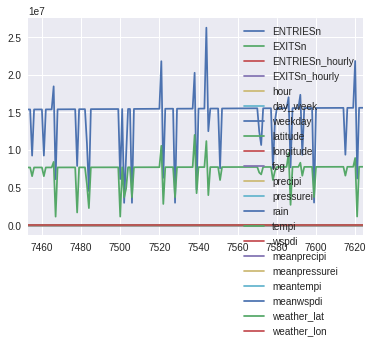

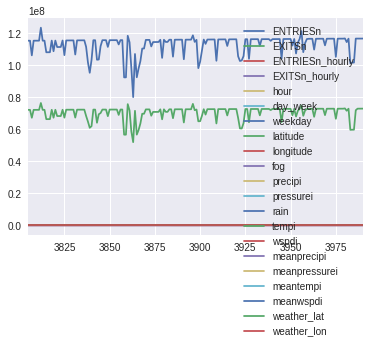

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

filename = '/home/loveshadev/PycharmProjects//Udacity/TestProject/DataAnalysis/nyc-subway-weather.csv'
subway_df = pd.read_csv(filename)

### Write code here to group the subway data by a variable of your choice, then
### either print out the mean ridership within each group or create a plot.

grouped_data = subway_df.groupby('station')
print grouped_data.mean()['tempi']
%pylab inline
grouped_data.plot()


In [3]:
ridership_df = pd.DataFrame({
    'UNIT': ['R051', 'R079', 'R051', 'R079', 'R051', 'R079', 'R051', 'R079', 'R051'],
    'TIMEn': ['00:00:00', '02:00:00', '04:00:00', '06:00:00', '08:00:00', '10:00:00', '12:00:00', '14:00:00',
              '16:00:00'],
    'ENTRIESn': [3144312, 8936644, 3144335, 8936658, 3144353, 8936687, 3144424, 8936819, 3144594],
    'EXITSn': [1088151, 13755385, 1088159, 13755393, 1088177, 13755598, 1088231, 13756191, 1088275]
})

def get_hourly_entries_and_exits(entries_and_exits):
    '''
    Fill in this function to take a DataFrame with cumulative entries
    and exits and return a DataFrame with hourly entries and exits.
    The hourly entries and exits should be calculated separately for
    each station (the 'UNIT' column).

    Hint: Take a look at the `get_hourly_entries_and_exits()` function
    you wrote in a previous quiz, DataFrame Vectorized Operations. If
    you copy it here and rename it, you can use it and the `.apply()`
    function to help solve this problem.
    '''
    return entries_and_exits-entries_and_exits.shift(1)

print ridership_df.groupby('UNIT')['ENTRIESn','EXITSn'].apply(get_hourly_entries_and_exits)

   ENTRIESn  EXITSn
0       NaN     NaN
1       NaN     NaN
2      23.0     8.0
3      14.0     8.0
4      18.0    18.0
5      29.0   205.0
6      71.0    54.0
7     132.0   593.0
8     170.0    44.0


In [6]:
import pandas as pd

subway_df = pd.DataFrame({
    'UNIT': ['R003', 'R003', 'R003', 'R003', 'R003', 'R004', 'R004', 'R004',
             'R004', 'R004'],
    'DATEn': ['05-01-11', '05-02-11', '05-03-11', '05-04-11', '05-05-11',
              '05-01-11', '05-02-11', '05-03-11', '05-04-11', '05-05-11'],
    'hour': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'ENTRIESn': [ 4388333,  4388348,  4389885,  4391507,  4393043, 14656120,
                 14656174, 14660126, 14664247, 14668301],
    'EXITSn': [ 2911002,  2911036,  2912127,  2913223,  2914284, 14451774,
               14451851, 14454734, 14457780, 14460818],
    'latitude': [ 40.689945,  40.689945,  40.689945,  40.689945,  40.689945,
                  40.69132 ,  40.69132 ,  40.69132 ,  40.69132 ,  40.69132 ],
    'longitude': [-73.872564, -73.872564, -73.872564, -73.872564, -73.872564,
                  -73.867135, -73.867135, -73.867135, -73.867135, -73.867135]
})

weather_df = pd.DataFrame({
    'DATEn': ['05-01-11', '05-01-11', '05-02-11', '05-02-11', '05-03-11',
              '05-03-11', '05-04-11', '05-04-11', '05-05-11', '05-05-11'],
    'hour': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'latitude': [ 40.689945,  40.69132 ,  40.689945,  40.69132 ,  40.689945,
                  40.69132 ,  40.689945,  40.69132 ,  40.689945,  40.69132 ],
    'longitude': [-73.872564, -73.867135, -73.872564, -73.867135, -73.872564,
                  -73.867135, -73.872564, -73.867135, -73.872564, -73.867135],
    'pressurei': [ 30.24,  30.24,  30.32,  30.32,  30.14,  30.14,  29.98,  29.98,
                   30.01,  30.01],
    'fog': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'rain': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    'tempi': [ 52. ,  52. ,  48.9,  48.9,  54. ,  54. ,  57.2,  57.2,  48.9,  48.9],
    'wspdi': [  8.1,   8.1,   6.9,   6.9,   3.5,   3.5,  15. ,  15. ,  15. ,  15. ]
})

def combine_dfs(subway_df, weather_df):
    '''
    Fill in this function to take 2 DataFrames, one with subway data and one with weather data,
    and return a single dataframe with one row for each date, hour, and location. Only include
    times and locations that have both subway data and weather data available.
    '''
    return subway_df.merge(weather_df,on=['DATEn','hour','latitude','longitude'],how='inner')
                           

Populating the interactive namespace from numpy and matplotlib


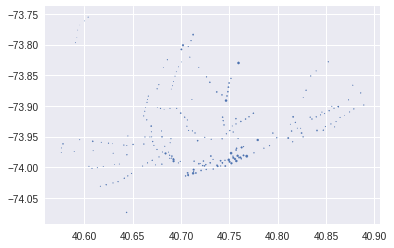

In [10]:
filename = '/home/loveshadev/PycharmProjects/Udacity/TestProject/DataAnalysis/nyc-subway-weather.csv'
subway_df = pd.read_csv(filename)

## Make a plot of your choice here showing something interesting about the subway data.
## Matplotlib documentation here: http://matplotlib.org/api/pyplot_api.html
## Once you've got something you're happy with, share it on the forums!
group_by_localization = subway_df.groupby(['latitude','longitude'], as_index=False).mean()
scatter_entries = group_by_localization['ENTRIESn_hourly']/group_by_localization['ENTRIESn_hourly'].std()
%pylab inline
plt.scatter(group_by_localization['latitude'],group_by_localization['longitude'],
            s=scatter_entries)